In [4]:
import pandas as pd
import numpy as np
import networkx as nx
from networkx.algorithms import community
from networkx.algorithms.community.centrality import girvan_newman
import matplotlib.pyplot as plt
import statistics
import scipy
import scipy.stats as stats

In [2]:
pd.set_option('display.max_rows', 100)

# Project Statment
####  Recommend products that are useful to the shopper, based on a selected item,

# Data

#### Properties
    - Products: every unique id is a product 
    - 1 Feature: Bought with implies an edge between col1 and col2. Edge is directed 0 -> 1

In [5]:
# Load Data
data = pd.read_csv('Amazon0302.txt', delim_whitespace=True, header=None)
data.head()

,0,1
0,0,1
1,0,2
2,0,3
3,0,4
4,0,5


## Get Nodes and Edges: Products and Bought With Feature

In [6]:
#get unique items from nodes to create node list
nodes = np.unique(data[[0,1]].values) #nodes are unique entries
edges = []
count = 0
for i in data[0]:
    edges.append((data[0][count],data[1][count])) #for every row, add a edge between col1Val and col2Val
    count = count+1
print(len(nodes), "unique items in dataset") 
print(len(edges), "edges in dataset") 

262111 unique items in dataset
1234877 edges in dataset


### Test specific edge 

In [6]:
print(edges[1])
e = (1,2)
print(type(e))


(0, 2)
<class 'tuple'>


## Playing Around

In [7]:
#create directed graph and add all nodes/edges to it
Graph = nx.DiGraph()
Graph.add_nodes_from(nodes)
Graph.add_edges_from(edges)

print("Sample Nodes", list(Graph.nodes)[None:5:None])
print("Sample Edges", list(Graph.edges)[None:5:None])


# Visualize 
#nx.draw_spring(Graph[:10])

# Get Degrees 
#nx.degree(Graph)

# nx.average_shortest_path_length(Graph) #Takes Forever 

#takes FOREVER, and becomes unreadable once we have too many nodes
#nx.draw(g)

Sample Nodes [0, 1, 2, 3, 4]
Sample Edges [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5)]


In [8]:
#Same thing, but undirected, just playing around
Graph1 = nx.Graph()
Graph1.add_nodes_from(nodes)
Graph1.add_edges_from(edges)

print("Sample Nodes", list(Graph.nodes)[None:5:None])
print("Sample Edges", list(Graph.edges)[None:5:None])

Sample Nodes [0, 1, 2, 3, 4]
Sample Edges [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5)]


In [9]:
#test avg clustering coefficient
print(nx.average_clustering(Graph))
print(nx.average_clustering(Graph1))
#print(nx.degree_centrality(Graph))
#print(nx.degree_centrality(Graph1))

0.346879407569872
0.4197800146076734
{0: 2.6706344664453853e-05, 1: 2.2891152569531873e-05, 2: 2.6706344664453853e-05, 3: 2.2891152569531873e-05, 4: 0.00011445576284765938, 5: 0.00022509633360039678, 6: 0.00039296478577696383, 7: 0.0001487924917019572, 8: 0.0011369272442867497, 9: 7.630384189843959e-05, 10: 0.0001487924917019572, 11: 0.00022128114150547478, 12: 0.00012971653122734728, 13: 0.00015260768379687917, 14: 6.867345770859562e-05, 15: 9.919499446797146e-05, 16: 4.196711304414177e-05, 17: 9.919499446797146e-05, 18: 0.0006752890008011903, 19: 8.011903399336156e-05, 20: 0.0002022051810308649, 21: 0.00024035710198008469, 22: 0.0002556178703597726, 23: 0.00023272671779024073, 24: 0.00010682537865781541, 25: 4.959749723398573e-05, 26: 6.485826561367364e-05, 27: 0.00017549883636641103, 28: 0.00017168364427148905, 29: 0.00017168364427148905, 30: 0.00020983556522070885, 31: 7.248864980351761e-05, 32: 0.0002022051810308649, 33: 0.0013963603067414444, 34: 0.00041204074625157374, 35: 0.000

In [10]:
print(nx.average_neighbor_degree(Graph))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [11]:
#communities_generator = community.girvan_newman(Graph)

In [12]:
#top_level_communities = next(communities_generator)

In [13]:
#next_level_communities = next(communities_generator)

In [14]:
#sorted(map(sorted, next_level_communities))

In [15]:
graphDegree=nx.degree(Graph)
print(type(graphDegree))
print(graphDegree)

<class 'networkx.classes.reportviews.DiDegreeView'>


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<class 'list'>
425
9.42254998836371


(array([0.0000e+00, 2.6080e+03, 4.2310e+03, 4.0570e+03, 5.2780e+03,
        5.2210e+03, 3.5919e+04, 4.0848e+04, 3.6749e+04, 3.0826e+04,
        2.4745e+04, 1.8382e+04, 1.3429e+04, 9.4350e+03, 6.8880e+03,
        5.0170e+03, 3.7700e+03, 2.7440e+03, 2.0240e+03, 1.6240e+03,
        1.2920e+03, 1.0250e+03, 7.9700e+02, 6.1600e+02, 5.3600e+02,
        4.5600e+02, 4.1200e+02, 3.1000e+02, 2.9600e+02, 2.3600e+02,
        2.1300e+02, 1.9800e+02, 1.5400e+02, 1.4100e+02, 1.3500e+02,
        1.1700e+02, 9.5000e+01, 9.2000e+01, 8.5000e+01, 7.4000e+01,
        6.6000e+01, 5.7000e+01, 5.5000e+01, 4.6000e+01, 4.9000e+01,
        4.0000e+01, 4.6000e+01, 3.7000e+01, 2.8000e+01, 3.6000e+01,
        3.0000e+01, 2.0000e+01, 2.5000e+01, 2.2000e+01, 2.6000e+01,
        2.2000e+01, 1.7000e+01, 1.4000e+01, 2.1000e+01, 1.7000e+01,
        1.7000e+01, 2.1000e+01, 1.3000e+01, 1.3000e+01, 8.0000e+00,
        1.4000e+01, 1.1000e+01, 8.0000e+00, 7.0000e+00, 1.2000e+01,
        7.0000e+00, 1.3000e+01, 9.0000e+00, 1.00

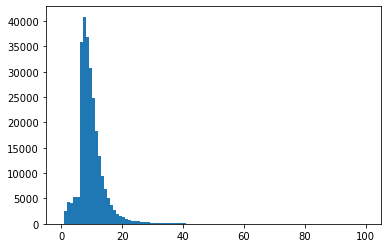

In [16]:
graphDegreeList = [v for k,v in nx.degree(Graph)]
print(type(graphDegreeList))
print(max(graphDegreeList))
print(sum(graphDegreeList)/len(graphDegreeList))
#print(test)
plt.hist(graphDegreeList,100,range=[0,100])

# Histogram
Show histogram to see shape of data and visualze how many edges each node has. 

9.42254998836371
5.919190677738518


(array([0.0000e+00, 2.6080e+03, 4.2310e+03, 4.0570e+03, 5.2780e+03,
        5.2210e+03, 3.5919e+04, 4.0848e+04, 3.6749e+04, 3.0826e+04,
        2.4745e+04, 1.8382e+04, 1.3429e+04, 9.4350e+03, 6.8880e+03,
        5.0170e+03, 3.7700e+03, 2.7440e+03, 2.0240e+03, 1.6240e+03,
        1.2920e+03, 1.0250e+03, 7.9700e+02, 6.1600e+02, 5.3600e+02,
        4.5600e+02, 4.1200e+02, 3.1000e+02, 2.9600e+02, 2.3600e+02,
        2.1300e+02, 1.9800e+02, 1.5400e+02, 1.4100e+02, 1.3500e+02,
        1.1700e+02, 9.5000e+01, 9.2000e+01, 8.5000e+01, 7.4000e+01,
        6.6000e+01, 5.7000e+01, 5.5000e+01, 4.6000e+01, 4.9000e+01,
        4.0000e+01, 4.6000e+01, 3.7000e+01, 2.8000e+01, 6.6000e+01]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
        26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
        39., 40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50.]),
 <BarContainer object of 50 a

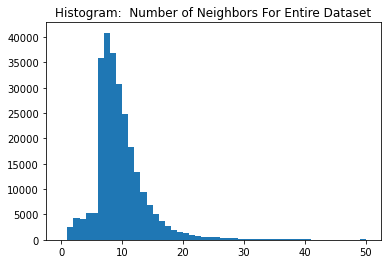

In [17]:
# Degree Histograph 
mu, std = stats.norm.fit(graphDegreeList)
print(mu)
print(std)
plt.title("Histogram:  Number of Neighbors For Entire Dataset")
plt.hist( [ v for k,v in nx.degree(Graph)],50,range=[0,50])

### Plot Subset of  Data
Plotting entire data of graph above causes grapht to centralize around the mean. 
On this smaller subset we see other values 

(array([6.700e+03, 1.143e+03, 1.590e+02, 3.300e+01, 1.700e+01, 7.300e+02,
        5.950e+02, 2.660e+02, 1.380e+02, 7.700e+01, 5.000e+01, 3.300e+01,
        2.500e+01, 1.300e+01, 1.900e+01, 1.000e+01, 1.100e+01, 8.000e+00,
        6.000e+00, 4.000e+00, 4.000e+00, 4.000e+00, 0.000e+00, 3.000e+00,
        2.000e+00, 2.000e+00, 0.000e+00, 3.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 2.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
        26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
        39., 40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50.]),
 <BarContainer object of 50 artists>)

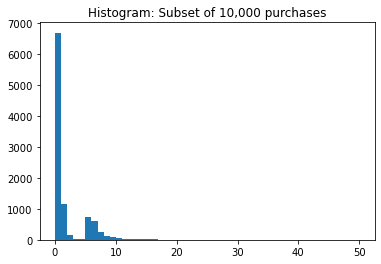

In [18]:
graph1 = nx.Graph()

xNodes = 10000
count = 0

# Add nodes
for i in range(xNodes):  
    graph1.add_node(nodes[count]) #Add unique node to graph
    count = count+1
    
# Add Edges
count = 0
xNodes = 10000

for i in range(xNodes):   
    graph1.add_edge(*edges[count])
    count = count+1
plt.title("Histogram: Subset of 10,000 purchases")
plt.hist( [ v for k,v in nx.degree(graph1)],50,range=[0,50])

# Cluster Data

In [19]:
# Compute clustering coefficient
clustering = nx.clustering(Graph)

In [20]:
print(type(clustering))
print("Some Clustering values: ")
maxValue = max(clustering,key=clustering.get)
print("\t Max Clustering Value: ", maxValue,clustering[maxValue])
avgValue = nx.average_clustering(Graph)
print("\t Avg Clustering Value: ", avgValue)

<class 'dict'>
Some Clustering values: 
	 Max Clustering Value:  823 1.0
	 Avg Clustering Value:  0.346879407569872


In [21]:
print("The graph is weakly connected: ", nx.is_weakly_connected(Graph))

The graph is weakly connected:  True


### Try to cluster

In [22]:
print(type(Graph))
print(type(nodes))
print(nodes[:5])

<class 'networkx.classes.digraph.DiGraph'>
<class 'numpy.ndarray'>
[0 1 2 3 4]


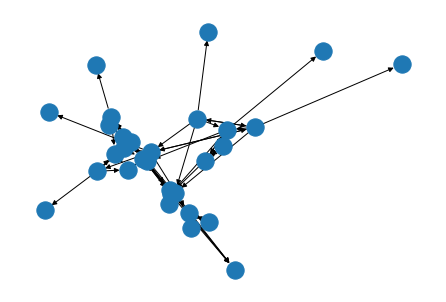

In [23]:
half = int(len(nodes)/2)

H = Graph.subgraph(nodes[:30])
nx.draw(H)

##### Using Girvan-newman

In [132]:
sub_graph = Graph.subgraph(nodes[:100])

In [133]:
communities_generator = community.girvan_newman(sub_graph)
communities_generator

<generator object girvan_newman at 0x0000022491ABF9E0>

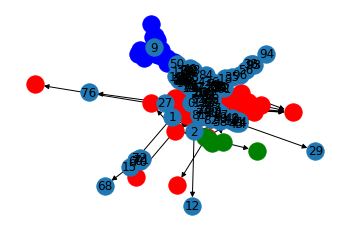

In [171]:
# Code from: https://stackoverflow.com/questions/60878425/color-nodes-according-the-communities-when-using-girvan-newman-algorithm-in-pyth
from IPython.display import clear_output

posi_gn = nx.spring_layout(sub_graph)
comp = nx.community.girvan_newman(sub_graph)

k = 3   # number of communities
for _ in range(k-1):
    comms = next(comp)

colors = 'rgb'
for nodes, c in zip(comms, colors):
    nx.draw_networkx_nodes(sub_graph, posi_gn, nodelist=nodes, node_color=[c])
    
clear_output
nx.draw_networkx_edges(sub_graph, posi_gn)
nx.draw(sub_graph, with_labels=True)

#### Try to cluster k communities
Takes too long to caluclate, even on sub-graph. Also not sure what to do with the tuple communities. 

from itertools import islice, takewhile

#comp = nx.girvan_newman(G)
groups = []
k = 4
i = 0
for communities in islice(communities_generator, k):
    print(i)
    groups.append(tuple(sorted(c) for c in communities))
    #print() 
    i = i + 1

#### Try to cluster using edge_betweeness_centrality function
#### code from: https://notebook.community/eflegara/NetStruc/6.%20Community%20Detection

In [27]:
sub_graph = Graph.subgraph(nodes[:5000])
K = sub_graph
ebet = nx.edge_betweenness_centrality(K)

In [28]:
import operator

sorted_ebet = sorted(ebet.items(), key=operator.itemgetter(1), reverse=True)
sorted_ebet[0:5]

[((18, 32), 0.08594028984120142),
 ((97, 117), 0.08569430024919662),
 ((32, 150), 0.06578810626764538),
 ((481, 18), 0.06477851206735458),
 ((189, 621), 0.05212529290146355)]

In [29]:
def remove_top_ebet(K2):
    j = 0 
    if (j % 100 == 0):
        print(j)
    ebet = nx.edge_betweenness_centrality(K2)
    sorted_ebet = sorted(ebet.items(), key=operator.itemgetter(1), reverse=True)
    edge_to_remove = sorted_ebet[0]
    K2.remove_edge(*edge_to_remove[0])
    j = j + 1
    return K2

In [30]:
K2 = K.copy()
for i in range(3):
    K2=remove_top_ebet(K2)

0
0
0


In [31]:
pos = nx.fruchterman_reingold_layout(K2);

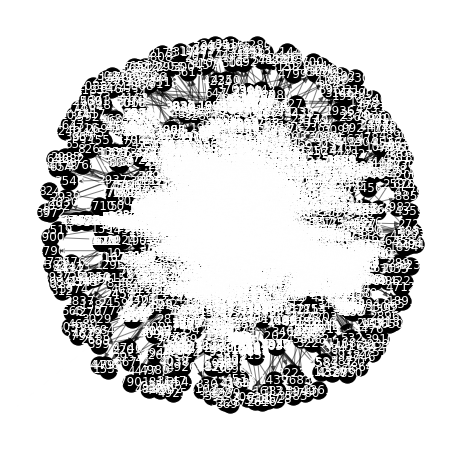

In [32]:
plt.figure(figsize=(8,8));
plt.axis("off");
nx.draw_networkx_nodes(K2, pos, node_size=300, node_color="black");
nx.draw_networkx_edges(K2, pos, alpha=0.500);
nx.draw_networkx_labels(K2, pos, font_color="white");
plt.show();

In [172]:
pos = nx.spring_layout(K2);

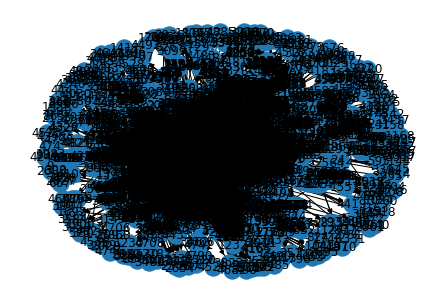

In [173]:
nx.draw(K2, pos)
nx.draw_networkx_labels(K2, pos)
plt.show()

##### Try clustering based on degree of node (i.e "largest most frequently bought item") 

In [34]:
Graph.degree[0]

7

In [35]:
graph_dict = dict(graphDegree)
print(type(graph_dict))

<class 'dict'>


In [36]:
import heapq
heapq.nlargest(3, graph_dict, key=graph_dict.get)

[14949, 4429, 33]

In [37]:
# Get the degree of every node in the graph
graphDegreeList = [v for k,v in nx.degree(Graph)]
print(max(graphDegreeList))
#print(graphDegreeList[:20])

425
[7, 6, 7, 6, 30, 59, 103, 39, 298, 20, 39, 58, 34, 40, 18, 26, 11, 26, 177, 21]


In [38]:
index = graphDegreeList.index(max(graphDegreeList))
print(index, Graph.degree[index])

14949 425


##### Graph Nodes with highest degree

In [176]:
highest_degrees = heapq.nlargest(24, graph_dict, key=graph_dict.get)

In [124]:
sub_graph = Graph.subgraph(highest_degrees)

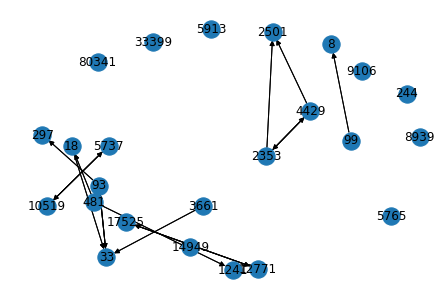

In [125]:
pos = nx.spring_layout(sub_graph, k = 1);
nx.draw(sub_graph, pos)
nx.draw_networkx_labels(sub_graph, pos)
nx.draw_networkx_edges(sub_graph, pos)
plt.show()

##### Try Adjacency Matrix and PageRank to rank items

In [126]:
pr = nx.pagerank(Graph, alpha=0.9)
sorted_nodes = sorted([(node, pagerank) for node, pagerank in pr.items()], key=lambda x:pr[x[0]])

In [127]:
imporant_nodes = []
for pair in sorted_nodes[:24]:
    ID = pair[0]
    imporant_nodes.append(ID)
    #print(ID,Graph.degree[ID] )

##### Graph imporant nodes

In [128]:
sub_graph = Graph.subgraph(imporant_nodes)

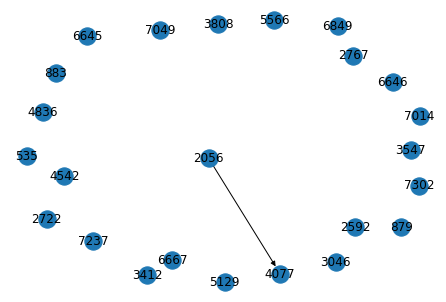

In [129]:
pos = nx.spring_layout(sub_graph, k = 1);
nx.draw(sub_graph, pos)
nx.draw_networkx_labels(sub_graph, pos)
plt.show()

### Analysis of Histogram
   - Most items have betwen 0 - 15 neighbors, with 9-10 being the most common value
   - Additionally, the degree of the graph has a standard deviation of 5.92 and a mean of 9.42.
    - This means that 68% of items are bought with 3.5 to 15.34 items
   - This means that we can specifically target items with a degree within that range to minimize buying less profitable items

# Content-Based Recommendation System

##  Create Item Profile
The amazon graph represents our item profile, it details what items have the feature 'bought with'

In [ ]:
data.head(15)

## Create User Profile
Will probably need to create random, or fake user data for simulation, i.e User buys x Item, this is reflected in their User profile. Id for product bought can be randomized in a loop

In [9]:
class UserProfile:
    def __init__(self):
        self.name = 'UserProfile Object'
        self.items_bought = {}
        
        #weights : fraction of total items bought 
        self.weights = {}
    
    def BuyItem(self,itemId):
        # Add Item to UserProfile 
        if itemId in self.items_bought:
            self.items_bought[itemId] = 1 + self.items_bought[itemId] 
        else: 
            self.items_bought[itemId] = 1
            
        #Update weight for that item
        self.updateWeights(itemId)
    
    def updateWeights(self, itemId):
        total = sum(self.items_bought.values())
        count = self.items_bought[itemId]
        self.weights[itemId] = count/total
    
    def Recommend(self, xProducts):
        d = self.weights
        max_weight_keys = [key for key, value in d.items() if value == max(d.values())] #returns list of items with max weight
        
        # Look up 'bought with' in item_profile 
        bought_with_product_ids = data[data[0] == max_weight_keys[0]][1] #look up fist max_weighted_product to see items bought with
        return bought_with_product_ids[:xProducts]
    

## Recommend
    - Calculate [User : ItemFeature] values. The ItemFeature is another product, so maybe a count value that is represented as a Weight for that item in the User Profile

In [10]:
# User takes action: user 'buys' product 
JaneSmith = UserProfile()
JaneSmith.BuyItem(65)
JaneSmith.BuyItem(10)
JaneSmith.BuyItem(65)
print("Item Bought and Count:")
print("\t", JaneSmith.items_bought)

# Get Weights for items bought
print("Weights")
print("\t", JaneSmith.weights)

# Recommend products based on weight
print("Recommended products")
x = 3
print(JaneSmith.Recommend(x))

#we can update the main graph after this to include item purchase data
#update main graph with # of items bought
for key in JaneSmith.items_bought.items():
            for items in Graph.edges(key[0]):
                Graph.add_edge(items[0],items[1],weight = key[1]) 

Item Bought and Count:
	 {65: 2, 10: 1}
Weights
	 {65: 0.6666666666666666, 10: 0.5}
Recommended products
319    63
320    66
321    99
Name: 1, dtype: int64


     - Query [items: features] amazon dataset to get items 'bought with'
     - E.g: User buys '2 apples, 1 pear'. Calculate weight for apples and pears. Take highest weight,        apples. Query('apple') to get all product 'bought with' apple.  " 
         - productsToRecommend = max(data[data[0] == 'apple'].groupby(data[1].unique))

## Store Owner Recommendation System

In [2]:
# Load Data
data = pd.read_csv('Amazon0302.txt', delim_whitespace=True, header=None)
data.head()
#get unique items from nodes to create node list
nodes = np.unique(data[[0,1]].values) #nodes are unique entries
edges = []
count = 0
for i in data[0]:
    edges.append((data[0][count],data[1][count])) #for every row, add a edge between col1Val and col2Val
    count = count+1
print(len(nodes), "unique items in dataset") 
print(len(edges), "edges in dataset") 
Graph = nx.DiGraph()
Graph.add_nodes_from(nodes)
Graph.add_edges_from(edges)

262111 unique items in dataset
1234877 edges in dataset


In [3]:
test = list(Graph.nodes)
print(Graph.degree(5))

59


501


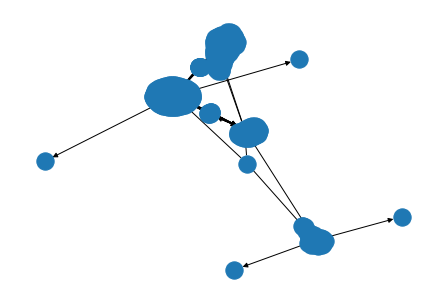

In [3]:
#store owner item purchasing recommendation, owner can input one item and see a list of recommended items, kind of a way around the clustering runtime
#itemNum = item node, desiredItems = num of items desired to return
desiredItems = 500
itemNum = 10
newGraph = nx.DiGraph()
newGraph.add_node(itemNum)
newGraphNodes = list(newGraph.nodes)
#use degree of edges from recommended items to build a cluster with the highest degree values
#prime by getting highest degree node and add
i = 0
maxDeg = 0
if(len(list(Graph.in_edges(itemNum)))>0):
    for edges in Graph.in_edges(newGraphNodes[i]):
        if (newGraph.number_of_nodes()>desiredItems):
                break
        newNode = edges[0]
        newGraph.add_node(newNode)
        newGraph.add_edge(newNode,newGraphNodes[i])
        if (Graph.degree(edges[0])>maxDeg and newNode): 
            nextNode = edges[0]
            maxDeg = Graph.degree(edges[0])
if(len(list(Graph.out_edges(itemNum)))>0):
    for edges in Graph.out_edges(newGraphNodes[i]):
        if (newGraph.number_of_nodes()>desiredItems):
                break
        newNode = edges[1]
        newGraph.add_node(newNode)
        newGraph.add_edge(newGraphNodes[i],newNode)
        if (Graph.degree(edges[1])>maxDeg): 
            nextNode = edges[1]
            maxDeg = Graph.degree(edges[0])
while(newGraph.number_of_nodes()<desiredItems):
    maxDeg = 0
    if(len(list(Graph.in_edges(itemNum)))>0):
        for edges in Graph.in_edges(nextNode):
            if (newGraph.number_of_nodes()>desiredItems):
                break
            newNode = edges[0]
            newGraph.add_node(newNode)
            newGraph.add_edge(newNode,nextNode)
        if (Graph.degree(edges[0])>maxDeg):
            nextNextNode = edges[0]
            maxDeg = Graph.degree(edges[0])
    if(len(list(Graph.out_edges(itemNum)))>0):
        for edges in Graph.out_edges(nextNode):
            if (newGraph.number_of_nodes()>desiredItems):
                break
            newNode = edges[1]
            newGraph.add_node(newNode)
            newGraph.add_edge(nextNode,newNode)
            if (Graph.degree(edges[1])>maxDeg): 
                nextNextNode = edges[1]
                maxDeg = Graph.degree(edges[0])
    nextNode = nextNextNode       

#visualize our new cluster

print(newGraph.number_of_nodes())
nx.draw(newGraph)

#print(newGraph.neighbors(0))